In [12]:
# Importing the libraries

import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt


# Ignore harmless warnings 

import warnings 
warnings.filterwarnings("ignore")

# Set to display all the columns in dataset

pd.set_option("display.max_columns", None)

# Import psql to run queries 

import pandasql as psql

In [13]:
#load the general dataset from kaggle search as  credit card fraud detection

CCdata= pd.read_csv(r"creditcard.csv", header=0) 

#Copy to back-up files 

CCdata_BK=CCdata.copy()

#Display First five claims

CCdata.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [14]:
# Seperate as 2 dataset based on the target variable class

Q1 = psql.sqldf("select * from CCdata where Class = 1 ")
Q2 = psql.sqldf("select * from CCdata where Class = 0 ")

In [15]:
# Random sample the data as 20% from "Major Class"

Q3 = Q2.groupby('Class', group_keys=False).apply(lambda x: x.sample(frac=0.2))

In [16]:
# Combine the 'minor class' and 20% of 'major class' data as new file

CCdataN = Q1.append(Q3, ignore_index=True)

# Display the shape of the file

CCdataN.shape

(57355, 31)

In [17]:
#Display the data information

CCdataN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57355 entries, 0 to 57354
Data columns (total 31 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    57355 non-null  float64
 1   V1      57355 non-null  float64
 2   V2      57355 non-null  float64
 3   V3      57355 non-null  float64
 4   V4      57355 non-null  float64
 5   V5      57355 non-null  float64
 6   V6      57355 non-null  float64
 7   V7      57355 non-null  float64
 8   V8      57355 non-null  float64
 9   V9      57355 non-null  float64
 10  V10     57355 non-null  float64
 11  V11     57355 non-null  float64
 12  V12     57355 non-null  float64
 13  V13     57355 non-null  float64
 14  V14     57355 non-null  float64
 15  V15     57355 non-null  float64
 16  V16     57355 non-null  float64
 17  V17     57355 non-null  float64
 18  V18     57355 non-null  float64
 19  V19     57355 non-null  float64
 20  V20     57355 non-null  float64
 21  V21     57355 non-null  float64
 22

In [18]:
# Count the target or dependent variable by '0' & '1' and their proportion 
# (>= 10 : 1, then the dataset is imbalance data)

Class_count = CCdataN.Class.value_counts()
print('Class 0:', Class_count[0])
print('Class 1:', Class_count[1])
print('Proportion:', round(Class_count[0] / Class_count[1], 2), ': 1')
print('Total CC Transaction:', len(CCdataN))

Class 0: 56863
Class 1: 492
Proportion: 115.58 : 1
Total CC Transaction: 57355


In [19]:
# Count the target or dependent variable by '0' & '1' and their proportion 
# (>= 10 : 1, then the dataset is imbalance data)

Class_count = CCdata.Class.value_counts()
print('Class 0:', Class_count[0])
print('Class 1:', Class_count[1])
print('Proportion:', round(Class_count[0] / Class_count[1], 2), ': 1')
print('Total CC Transaction:', len(CCdata))

Class 0: 284315
Class 1: 492
Proportion: 577.88 : 1
Total CC Transaction: 284807


In [20]:
del CCdataN['Time']
CCdataN.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-2.312227,1.951992,-1.609851,3.997906,-0.522188,-1.426545,-2.537387,1.391657,-2.770089,-2.772272,3.202033,-2.899907,-0.595222,-4.289254,0.389724,-1.140747,-2.830056,-0.016822,0.416956,0.126911,0.517232,-0.035049,-0.465211,0.320198,0.044519,0.177840,0.261145,-0.143276,0.00,1
1,-3.043541,-3.157307,1.088463,2.288644,1.359805,-1.064823,0.325574,-0.067794,-0.270953,-0.838587,-0.414575,-0.503141,0.676502,-1.692029,2.000635,0.666780,0.599717,1.725321,0.283345,2.102339,0.661696,0.435477,1.375966,-0.293803,0.279798,-0.145362,-0.252773,0.035764,529.00,1
2,-2.303350,1.759247,-0.359745,2.330243,-0.821628,-0.075788,0.562320,-0.399147,-0.238253,-1.525412,2.032912,-6.560124,0.022937,-1.470102,-0.698826,-2.282194,-4.781831,-2.615665,-1.334441,-0.430022,-0.294166,-0.932391,0.172726,-0.087330,-0.156114,-0.542628,0.039566,-0.153029,239.93,1
3,-4.397974,1.358367,-2.592844,2.679787,-1.128131,-1.706536,-3.496197,-0.248778,-0.247768,-4.801637,4.895844,-10.912819,0.184372,-6.771097,-0.007326,-7.358083,-12.598419,-5.131549,0.308334,-0.171608,0.573574,0.176968,-0.436207,-0.053502,0.252405,-0.657488,-0.827136,0.849573,59.00,1
4,1.234235,3.019740,-4.304597,4.732795,3.624201,-1.357746,1.713445,-0.496358,-1.282858,-2.447469,2.101344,-4.609628,1.464378,-6.079337,-0.339237,2.581851,6.739384,3.042493,-2.721853,0.009061,-0.379068,-0.704181,-0.656805,-1.632653,1.488901,0.566797,-0.010016,0.146793,1.00,1


In [21]:
#displaying duplicate values with in dataset

CCdataN_dup=CCdataN[CCdataN.duplicated(keep='last')]

#displaying the duplicate recordsgtgyr

CCdataN_dup

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
225,-13.192671,12.785971,-9.906650,3.320337,-4.801176,5.760059,-18.750889,-37.353443,-0.391540,-5.052502,4.406806,-4.610756,-1.909488,-9.072711,-0.226074,-6.211557,-6.248145,-3.149247,0.051576,-3.493050,27.202839,-8.887017,5.303607,-0.639435,0.263203,-0.108877,1.269566,0.939407,1.00,1
226,-13.192671,12.785971,-9.906650,3.320337,-4.801176,5.760059,-18.750889,-37.353443,-0.391540,-5.052502,4.406806,-4.610756,-1.909488,-9.072711,-0.226074,-6.211557,-6.248145,-3.149247,0.051576,-3.493050,27.202839,-8.887017,5.303607,-0.639435,0.263203,-0.108877,1.269566,0.939407,1.00,1
227,-13.192671,12.785971,-9.906650,3.320337,-4.801176,5.760059,-18.750889,-37.353443,-0.391540,-5.052502,4.406806,-4.610756,-1.909488,-9.072711,-0.226074,-6.211557,-6.248145,-3.149247,0.051576,-3.493050,27.202839,-8.887017,5.303607,-0.639435,0.263203,-0.108877,1.269566,0.939407,1.00,1
228,-13.192671,12.785971,-9.906650,3.320337,-4.801176,5.760059,-18.750889,-37.353443,-0.391540,-5.052502,4.406806,-4.610756,-1.909488,-9.072711,-0.226074,-6.211557,-6.248145,-3.149247,0.051576,-3.493050,27.202839,-8.887017,5.303607,-0.639435,0.263203,-0.108877,1.269566,0.939407,1.00,1
229,-13.192671,12.785971,-9.906650,3.320337,-4.801176,5.760059,-18.750889,-37.353443,-0.391540,-5.052502,4.406806,-4.610756,-1.909488,-9.072711,-0.226074,-6.211557,-6.248145,-3.149247,0.051576,-3.493050,27.202839,-8.887017,5.303607,-0.639435,0.263203,-0.108877,1.269566,0.939407,1.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54561,1.315404,-0.033577,-1.089984,-0.557087,2.029931,3.268130,-0.534994,0.808250,-0.052724,0.001149,-0.028609,0.073657,0.041285,0.425500,1.245277,0.640368,-0.910237,-0.068698,0.255268,0.016952,-0.313307,-1.068934,0.103797,0.992126,0.369398,0.110374,-0.028302,0.011836,1.98,0
55670,2.127658,-0.123749,-1.752552,0.037622,0.426770,-0.566874,0.077238,-0.189978,0.962464,-0.066193,-1.526618,-0.506945,-0.913594,0.651192,1.068642,-0.018823,-0.731512,0.464107,0.075741,-0.274727,0.207941,0.697797,-0.056062,0.078354,0.404913,-0.409052,-0.004385,-0.056021,1.00,0
56271,1.332849,0.389198,-2.165597,-0.306873,2.641351,2.808084,-0.171627,0.683352,-0.297962,-0.652097,0.418003,-0.322437,-0.143469,-1.154524,1.157634,0.878175,0.536918,0.712873,0.006774,0.053607,-0.207432,-0.692417,-0.118598,0.891480,0.730240,0.384013,-0.028465,0.036123,0.76,0
56725,1.311258,0.075028,-1.292832,-0.483154,2.139257,3.181564,-0.505045,0.804860,-0.074071,-0.217426,0.131576,-0.028146,0.011460,-0.112921,1.300007,0.812807,-0.495483,0.166473,0.175176,0.032734,-0.342676,-1.148504,0.095279,0.946121,0.369713,0.110626,-0.021837,0.023638,1.98,0


In [22]:
#remove the identified duplicate records

CCdataN=CCdataN.drop_duplicates()

#display the size of the dataset

CCdataN.shape

(56631, 30)

In [23]:
#Re-setting the row index

CCdataN=CCdataN.reset_index(drop=True)

#copy file to backup file after deletion of duplicate records

CCdataN_BK2 =CCdataN.copy()

In [24]:
#display the information of the dataset

CCdataN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56631 entries, 0 to 56630
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      56631 non-null  float64
 1   V2      56631 non-null  float64
 2   V3      56631 non-null  float64
 3   V4      56631 non-null  float64
 4   V5      56631 non-null  float64
 5   V6      56631 non-null  float64
 6   V7      56631 non-null  float64
 7   V8      56631 non-null  float64
 8   V9      56631 non-null  float64
 9   V10     56631 non-null  float64
 10  V11     56631 non-null  float64
 11  V12     56631 non-null  float64
 12  V13     56631 non-null  float64
 13  V14     56631 non-null  float64
 14  V15     56631 non-null  float64
 15  V16     56631 non-null  float64
 16  V17     56631 non-null  float64
 17  V18     56631 non-null  float64
 18  V19     56631 non-null  float64
 19  V20     56631 non-null  float64
 20  V21     56631 non-null  float64
 21  V22     56631 non-null  float64
 22

In [25]:
#Display the unique values of all the varaiables

CCdataN.nunique()

V1        56631
V2        56631
V3        56631
V4        56631
V5        56631
V6        56631
V7        56631
V8        56631
V9        56631
V10       56631
V11       56631
V12       56631
V13       56631
V14       56631
V15       56631
V16       56631
V17       56631
V18       56631
V19       56631
V20       56631
V21       56631
V22       56631
V23       56631
V24       56631
V25       56631
V26       56631
V27       56631
V28       56631
Amount    13731
Class         2
dtype: int64

In [26]:
#Display the missing values information of variables

CCdataN.isnull().sum()

V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [27]:
#displaying 'class' categorical variable

CCdataN['Class'].value_counts()

0    56158
1      473
Name: Class, dtype: int64

In [28]:
#displaying the all the variables

CCdataN.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount', 'Class'],
      dtype='object')

In [29]:
#Identifying the Independent and Target(Dependent) variables
IndepVar =[]
for col in CCdataN.columns:
    if col != 'Class':
        IndepVar.append(col)
        
TargetVar ='Class'

x = CCdataN[IndepVar]
y = CCdataN[TargetVar]

In [30]:
# Random oversampling can be implemented using the RandomOverSampler class

from imblearn.over_sampling import RandomOverSampler

oversample = RandomOverSampler(sampling_strategy=0.125)

x_over, y_over = oversample.fit_resample(x, y)

print(x_over.shape)
print(y_over.shape)

(63177, 29)
(63177,)


In [21]:
# Splitting the dataset into train and test 

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_over, y_over, test_size = 0.30, random_state = 42)

# Display the shape 

x_train.shape, x_test.shape, y_train.shape, y_test.shape

((44229, 29), (18956, 29), (44229,), (18956,))

In [22]:
# Scaling the features by using MinMaxScaler

from sklearn.preprocessing import MinMaxScaler

mmscaler = MinMaxScaler(feature_range=(0, 1))

x_train= mmscaler.fit_transform(x_train)
x_train = pd.DataFrame(x_train)

x_test = mmscaler.fit_transform(x_test)
x_test = pd.DataFrame(x_test)

# lOGISTIC REGRESSION

In [23]:
# To build the 'Logistic Regression' model with random sampling 
from sklearn.linear_model import LogisticRegression
# create an object for model
ModelLR= LogisticRegression()
# train the model
ModelLR.fit(x_train,y_train)
# predict themodel with test the dataset
y_pred=ModelLR.predict(x_test)
y_pred_prob=ModelLR.predict_proba(x_test)

In [24]:
#To display the algorithm hyper paramaters

params=ModelLR.get_params()
print(params)

{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


Confusion matrix : 
 [[ 1630   455]
 [    6 16865]]
Outcome values : 
 1630 455 6 16865
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.78      0.88      2085
           0       0.97      1.00      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.99      0.89      0.93     18956
weighted avg       0.98      0.98      0.97     18956

Accuracy : 97.6 %
Precision : 99.6 %
Recall : 78.2 %
F1 Score : 0.876
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 89.1 %
MCC : 0.871
roc_auc_score: 0.891


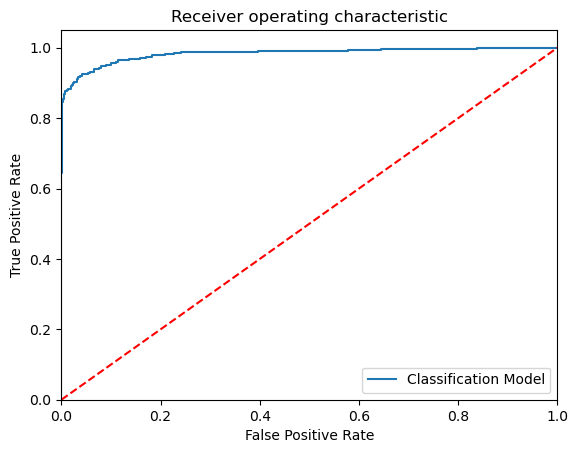

-----------------------------------------------------------------------------------------------------


In [25]:
# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test

# Predicted values

predicted = y_pred

# Confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0], sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# Outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)
# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelLR.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [26]:
# display the final results

Results=pd.DataFrame({'Class_A':y_test,'Class_P':y_pred})

# Merge two dataframes on the index of both the dataframe

ResultsFinal1=CCdata_BK.merge(Results,left_index=True,right_index=True)

# display 10 records randomly

ResultsFinal1.sample(10)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Class_A,Class_P
21124,31482.0,1.051556,-1.064299,-0.107048,-0.692384,-0.913883,-0.601232,-0.247497,-0.155132,-1.121043,0.747714,1.115266,-0.156804,-0.062853,0.194689,0.027263,1.317144,-0.059872,-0.720491,0.875138,0.449441,0.350918,0.486489,-0.325642,0.054077,0.569959,-0.132862,-0.046416,0.028590,194.85,0,0,0
8305,11086.0,-0.182049,0.534337,1.317379,1.735990,-0.472466,1.531518,-0.724238,-1.384876,2.000744,-0.614165,-0.819604,-2.906679,0.215736,1.417024,-0.739875,-0.867390,1.420419,-0.020926,0.734191,-0.434316,1.199651,-0.939429,-0.507470,-0.813763,1.148263,0.005315,0.268109,0.163228,117.00,0,0,0
8454,11344.0,0.642917,-1.183711,0.182570,0.466493,-0.889379,-0.119286,-0.061722,-0.064088,1.958735,-0.675199,1.464650,-2.017898,0.515854,1.669750,-1.557350,-0.010239,0.623491,0.358012,0.579237,0.453094,-0.059986,-0.471944,-0.362129,0.023690,0.282999,1.047067,-0.163800,0.031722,317.20,0,0,0
21913,31930.0,0.988739,-0.538082,1.234585,0.804174,-1.162629,0.340033,-0.864156,0.437695,0.929814,-0.082815,1.053712,0.294974,-1.948653,0.211357,-0.054337,0.100274,0.035633,-0.018693,-0.188902,-0.151895,0.008139,0.018064,0.054211,0.211449,0.043747,0.317835,0.008870,0.019869,55.90,0,0,0
48939,43847.0,1.059160,-0.074090,1.511507,2.057495,-0.937765,0.332878,-0.657167,0.261150,0.345572,0.255400,-0.510726,0.406241,-0.212636,-0.506598,-0.582160,0.013960,0.323892,-1.206785,-0.800347,-0.140868,-0.179621,-0.319205,0.162334,0.437340,-0.007251,0.848941,-0.015060,0.022072,18.96,0,0,0
42765,41236.0,-3.326726,-5.031626,2.025639,-0.494412,3.354427,-3.112266,-3.081281,0.316560,-0.216708,0.604443,-0.478324,-0.938248,-0.424692,-0.398127,0.912806,1.176991,0.069057,-0.977470,-0.658925,1.329115,0.904488,1.262133,0.909872,0.059188,-0.575335,-0.319335,-0.132570,0.060674,69.99,0,0,0
37240,38871.0,-0.763017,-0.678538,1.421298,-2.322817,-0.045755,-1.015751,-0.180228,-0.136763,-2.401684,0.650030,-1.412826,-1.320704,0.124684,-0.483161,-0.898115,-0.692422,0.498428,-0.032413,-0.246103,-0.205774,-0.153353,-0.172072,-0.339915,-0.123539,0.776282,-0.115886,0.012140,0.054016,12.12,0,0,0
32557,36849.0,0.963430,-0.165339,0.239790,1.366771,-0.561880,-0.854948,0.248675,-0.179599,0.123385,0.030419,-0.592319,-0.363090,-0.944440,0.560201,1.064854,0.216009,-0.412023,0.083559,-0.511317,0.077930,0.143140,0.096782,-0.221129,0.363238,0.588595,-0.291675,-0.014688,0.044109,144.00,0,0,0
24418,33225.0,1.151411,0.012702,1.118362,0.681750,-0.843163,-0.387287,-0.454712,0.054129,0.369860,-0.146766,0.226378,0.599456,0.448396,-0.017386,1.492718,0.188258,-0.169509,-0.662852,-0.834340,-0.105005,0.005917,0.084664,0.139007,0.422615,0.065243,0.258702,0.017148,0.027992,6.90,0,0,0
44389,41926.0,-6.756172,5.798609,-3.180971,-2.236401,-2.747170,-1.261085,-1.958949,2.969505,2.647029,3.816162,-1.630338,1.233351,1.123751,0.423512,0.540187,1.225522,-0.119155,-0.232099,-1.059657,1.867946,-0.458488,-0.831747,0.453444,-0.485675,0.998996,0.846806,1.125809,0.540277,3.69,0,0,0


# decision tree

In [27]:
#Train the algorithm and build the model with trian dataset

from sklearn.tree import DecisionTreeClassifier

#create an object for regression model

ModelDT=DecisionTreeClassifier()

#Train the model with training dataset

ModelDT.fit(x_train,y_train)

#predict the model with test dataset

y_pred=ModelDT.predict(x_test)
y_pred_prob=ModelDT.predict_proba(x_test) 

In [28]:
#To display the algorithm hyper paramaters

params=ModelDT.get_params()
print(params)

{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


Confusion matrix : 
 [[ 1372   713]
 [   27 16844]]
Outcome values : 
 1372 713 27 16844
Classification report : 
               precision    recall  f1-score   support

           1       0.98      0.66      0.79      2085
           0       0.96      1.00      0.98     16871

    accuracy                           0.96     18956
   macro avg       0.97      0.83      0.88     18956
weighted avg       0.96      0.96      0.96     18956

Accuracy : 96.1 %
Precision : 98.1 %
Recall : 65.8 %
F1 Score : 0.788
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 82.8 %
MCC : 0.786
roc_auc_score: 0.828


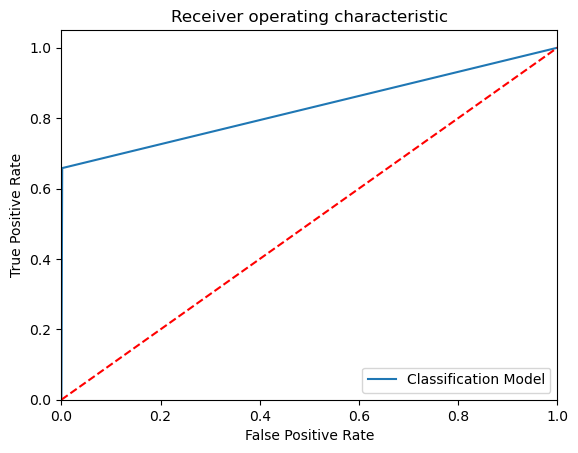

-----------------------------------------------------------------------------------------------------


In [29]:
# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test

# Predicted values

predicted = y_pred

# Confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0], sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)
# Outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);
# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)
# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelDT.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [30]:
# display the final results

Results= pd.DataFrame({'Class_A':y_test,'Class_P':y_pred})

# Merge two Dataframes on index of both the dataframes

ResultsFinal=CCdata_BK.merge(Results, left_index=True, right_index=True)

# Display 10 records randomly

ResultsFinal.sample(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Class_A,Class_P
40832,40421.0,-1.948894,1.809241,-0.301822,1.013627,-0.744451,-1.150619,-0.137108,1.075017,-0.819383,-0.255249,-0.967063,0.210806,-0.161389,1.318023,0.846484,-0.081297,0.381432,0.081893,0.450117,-0.151513,0.144928,0.226184,-0.009221,0.380393,-0.099232,-0.353162,0.081246,-0.023569,21.16,0,0,0
61071,49644.0,-1.729239,-0.985325,1.437791,0.648798,2.050047,-1.619360,-0.472902,0.212754,-0.212764,-0.395150,-0.659006,-0.390075,-1.008787,0.503999,0.679794,-0.008422,-0.363601,-0.238637,-1.333167,0.211904,0.363331,0.479029,0.196374,0.044751,-0.158715,-0.468085,0.087079,0.188461,8.13,0,1,1
11388,19870.0,-0.724175,0.386449,2.796262,-1.673363,-0.403343,-0.386168,0.334569,-0.107970,2.587804,-2.076234,0.839674,-2.163650,1.047125,1.037526,0.232323,-0.769257,0.674541,0.010100,-0.639021,-0.129056,-0.112575,0.241108,-0.295603,0.343680,0.336740,-0.831692,-0.068872,-0.152894,11.85,0,0,0
48401,43627.0,1.084804,-1.601289,0.499219,-1.171543,-1.834340,-0.812363,-0.718849,-0.291694,-1.924549,1.282370,-0.244698,-0.274398,1.621098,-0.541043,0.666497,-0.209354,0.371704,-0.168757,-0.315723,0.184767,-0.225598,-0.738860,-0.023659,0.379818,0.087615,-0.437020,0.008986,0.069863,229.70,0,0,0
40027,40064.0,-0.405616,0.686807,0.978962,0.991746,1.100755,0.872931,0.865910,-0.058131,-0.153807,0.067221,-1.676980,-0.053009,0.718336,-0.392199,0.288475,-0.920402,-0.019365,-0.307575,1.241606,0.430153,-0.132083,0.078336,-0.238289,-1.291762,0.116877,-0.168747,0.247471,-0.024999,52.65,0,0,0


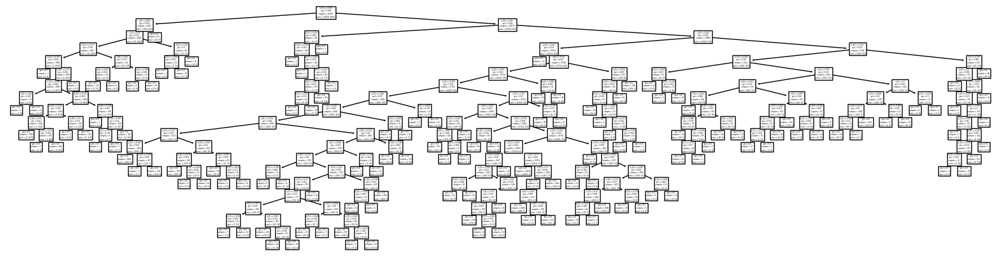

In [31]:
#plot the decision tree

import matplotlib.pyplot as plt
from sklearn import tree
plt.figure(figsize=(20,5))
tree.plot_tree(ModelDT);

# random forest algorithm

In [32]:
#Train the algorithm and build the model with trian dataset

from sklearn.ensemble import RandomForestClassifier

#create an object for regression model

ModelRF= RandomForestClassifier()

#Train the model with training dataset

ModelRF.fit(x_train,y_train)

#predict the model with test dataset

y_pred=ModelRF.predict(x_test)
y_pred_prob=ModelRF.predict_proba(x_test) 

Confusion matrix : 
 [[ 1420   665]
 [    3 16868]]
Outcome values : 
 1420 665 3 16868
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.68      0.81      2085
           0       0.96      1.00      0.98     16871

    accuracy                           0.96     18956
   macro avg       0.98      0.84      0.90     18956
weighted avg       0.97      0.96      0.96     18956

Accuracy : 96.5 %
Precision : 99.8 %
Recall : 68.1 %
F1 Score : 0.81
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 84.0 %
MCC : 0.808
roc_auc_score: 0.84


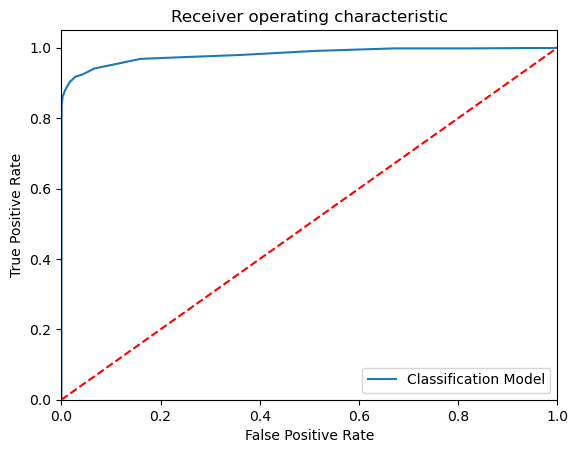

-----------------------------------------------------------------------------------------------------


In [33]:
# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test

# Predicted values

predicted = y_pred

# Confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0], sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)
# Outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);
# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)
# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelRF.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [34]:
# display the final results

Results= pd.DataFrame({'Class_A':y_test,'Class_P':y_pred})

# Merge two Dataframes on index of both the dataframes

ResultsFinal =CCdata_BK.merge(Results, left_index=True, right_index=True)

# Display 10 records randomly

ResultsFinal.sample(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Class_A,Class_P
50407,44478.0,1.148892,-0.307174,1.433941,-0.001534,-1.270509,-0.281806,-0.868198,0.109927,0.746898,-0.321104,0.326578,0.822695,1.071552,-0.380189,1.829338,0.417743,-0.246058,-0.389748,-0.835688,-0.008123,0.260314,0.865344,0.048076,0.511166,-0.022705,1.150749,-0.008255,0.024588,14.00,0,0,0
10417,16837.0,-0.716024,1.433246,1.413276,0.847704,0.070757,-0.565428,0.714437,-0.197092,1.192028,0.643245,2.235842,-2.618963,0.241454,1.856313,-0.234532,-0.291354,0.316382,0.899025,0.361581,0.330224,-0.106477,0.332516,-0.147540,0.447269,-0.242311,-0.400890,0.428812,0.109856,7.03,0,0,0
7474,10164.0,1.277246,-0.472565,0.971310,-1.045943,-1.354531,-0.896384,-0.826516,-0.083898,3.372294,-1.500400,0.381646,-2.290328,0.731219,1.392226,0.699451,-0.406843,0.709630,0.585167,0.478887,-0.190027,-0.049104,0.332936,-0.079693,0.385664,0.430920,0.078671,0.012803,0.014692,2.00,0,0,0
578,432.0,-2.149164,0.128062,-0.155949,-0.050980,-0.646231,-1.027986,0.499062,0.769078,-0.479644,-0.711915,0.570784,0.519427,-1.282064,1.082844,-1.262652,0.346261,-0.121679,0.148746,-0.253665,-0.348887,0.154950,0.370655,0.520347,0.555705,-0.318997,0.274310,0.184559,-0.296836,102.13,0,0,0
33852,37412.0,1.234848,0.693741,-0.570387,0.812455,0.402725,-0.960529,0.412969,-0.246613,-0.349505,-0.791390,0.616790,0.569767,1.071257,-1.503510,1.090655,0.202800,1.247986,-0.327880,-0.732724,-0.026455,-0.112713,-0.174721,-0.067972,-0.005488,0.537779,0.394634,-0.006489,0.042001,0.76,0,0,0


# extra tree classifier

Confusion matrix : 
 [[ 1318   767]
 [    3 16868]]
Outcome values : 
 1318 767 3 16868
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.63      0.77      2085
           0       0.96      1.00      0.98     16871

    accuracy                           0.96     18956
   macro avg       0.98      0.82      0.88     18956
weighted avg       0.96      0.96      0.96     18956

Accuracy : 95.9 %
Precision : 99.8 %
Recall : 63.2 %
F1 Score : 0.774
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 81.6 %
MCC : 0.777
roc_auc_score: 0.816


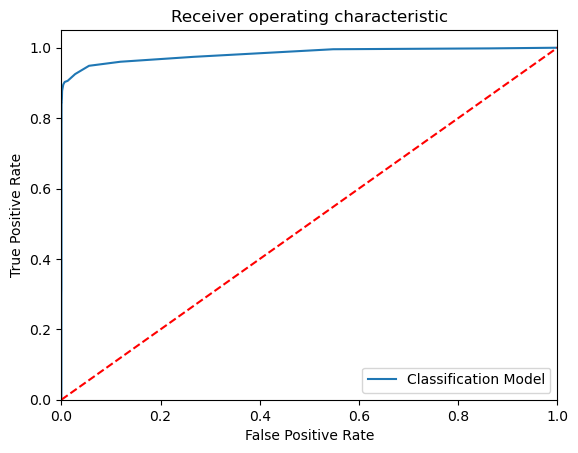

-----------------------------------------------------------------------------------------------------


In [35]:
# To build the 'Random Forest' model with random sampling

from sklearn.ensemble import ExtraTreesClassifier

# Create an object for Extra Trees Classifier 

ModelET = ExtraTreesClassifier()

# Train the model with train data 

ModelET.fit(x_train,y_train)

# Predict the model with test data set

y_pred = ModelET.predict(x_test)
y_pred_prob = ModelET.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual, predicted, labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelET.predict_proba(x_test)[:,1])
plt.figure()
#--------------------------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [36]:
#load the data
EMResults=pd.read_csv(r"EMResults.csv")
EMResults.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision\tRecall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


Model Name:  LogisticRegression()
Confusion matrix : 
 [[ 1630   455]
 [    6 16865]]
Outcome values : 
 1630 455 6 16865
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.78      0.88      2085
           0       0.97      1.00      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.99      0.89      0.93     18956
weighted avg       0.98      0.98      0.97     18956

Accuracy : 97.6 %
Precision : 99.6 %
Recall : 78.2 %
F1 Score : 0.876
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 89.1 %
MCC : 0.871
roc_auc_score: 0.891


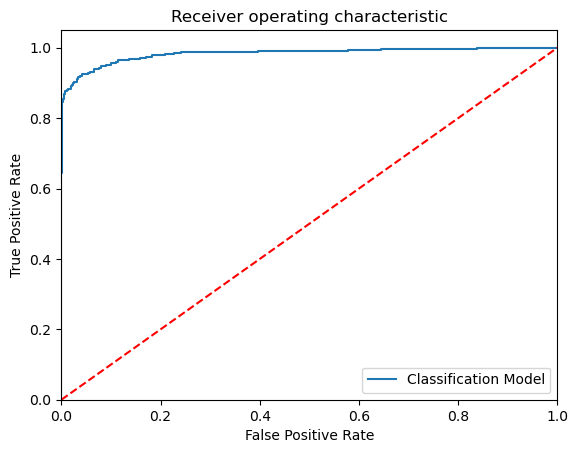

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[ 1478   607]
 [    7 16864]]
Outcome values : 
 1478 607 7 16864
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.71      0.83      2085
           0       0.97      1.00      0.98     16871

    accuracy                           0.97     18956
   macro avg       0.98      0.85      0.91     18956
weighted avg       0.97      0.97      0.97     18956

Accuracy : 96.8 %
Precision : 99.5 %
Recall : 70.9 %
F1 Score : 0.828
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 85.4 %
MCC : 0.825
roc_auc_score: 0.854


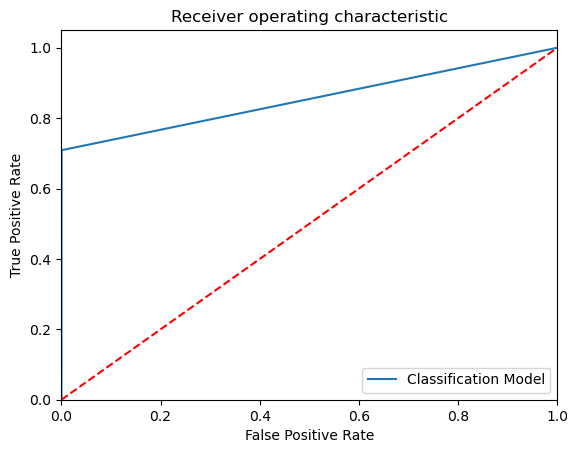

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[ 1511   574]
 [    3 16868]]
Outcome values : 
 1511 574 3 16868
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.72      0.84      2085
           0       0.97      1.00      0.98     16871

    accuracy                           0.97     18956
   macro avg       0.98      0.86      0.91     18956
weighted avg       0.97      0.97      0.97     18956

Accuracy : 97.0 %
Precision : 99.8 %
Recall : 72.5 %
F1 Score : 0.84
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 86.2 %
MCC : 0.836
roc_auc_score: 0.862


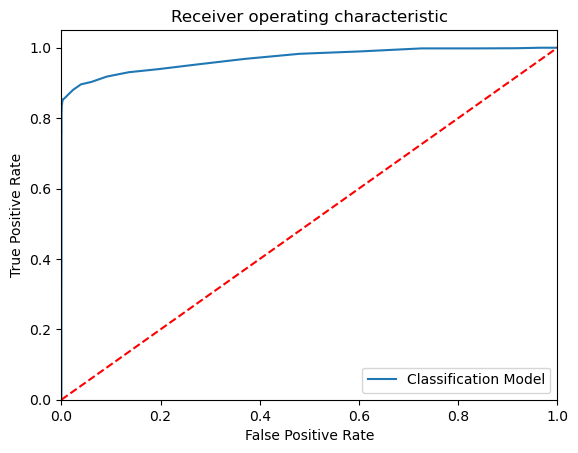

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[ 1467   618]
 [    3 16868]]
Outcome values : 
 1467 618 3 16868
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.70      0.83      2085
           0       0.96      1.00      0.98     16871

    accuracy                           0.97     18956
   macro avg       0.98      0.85      0.90     18956
weighted avg       0.97      0.97      0.96     18956

Accuracy : 96.7 %
Precision : 99.8 %
Recall : 70.4 %
F1 Score : 0.825
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 85.2 %
MCC : 0.823
roc_auc_score: 0.852


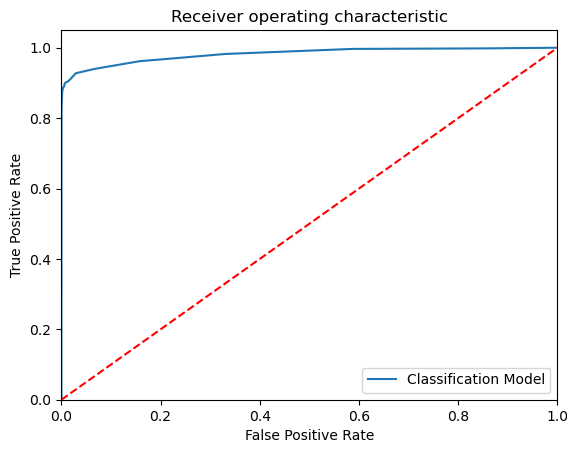

-----------------------------------------------------------------------------------------------------


In [37]:
# Build the Calssification models and compare the results

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
#from sklearn.neighbors import KNeighborsClassifier
#from sklearn.naive_bayes import GaussianNB
#from sklearn.svm import SVC

# Create objects of classification algorithms with default hyper-parameters

ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
#ModelKNN = KNeighborsClassifier(n_neighbors=5)
#ModelGNB = GaussianNB()
#ModelSVM = SVC(probability=True)

# Evalution matrix for all the algorithms

#MM = [ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelGNB, ModelSVM]
MM = [ModelLR, ModelDC, ModelRF, ModelET]
for models in MM:
            
    # Train the model training dataset
    
    models.fit(x_train, y_train)
    
    # Prediction the model with test dataset
    
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)
    
    # Print the model name
    
    print('Model Name: ', models)
    
    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])

    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve 

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    Model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
    #
    plt.plot(fpr, tpr, label= 'Classification Model' % Model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #----------------------------------------------------------------------------------------------------------
    new_row = {'Model Name' : models,
               'True_Positive': tp,
               'False_Negative': fn, 
               'False_Positive': fp, 
               'True_Negative': tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    EMResults = EMResults.append(new_row, ignore_index=True)

In [38]:
#display the first 5 data
EMResults.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision\tRecall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy,Precision,Recall
0,LogisticRegression(),1630,455,6,16865,0.976,NaN,0.876,1.0,0.871,0.890709,0.891,0.996,0.782
1,DecisionTreeClassifier(),1478,607,7,16864,0.968,NaN,0.828,1.0,0.825,0.854229,0.854,0.995,0.709
2,"(DecisionTreeClassifier(max_features='sqrt', r...",1511,574,3,16868,0.970,NaN,0.840,1.0,0.836,0.862261,0.862,0.998,0.725
3,"(ExtraTreeClassifier(random_state=552751377), ...",1467,618,3,16868,0.967,NaN,0.825,1.0,0.823,0.851710,0.852,0.998,0.704


In [39]:
#display all the variables

CCdata.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [40]:
# Create a list for plotting the decision trees

figcols = ['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount', 'Class']
   

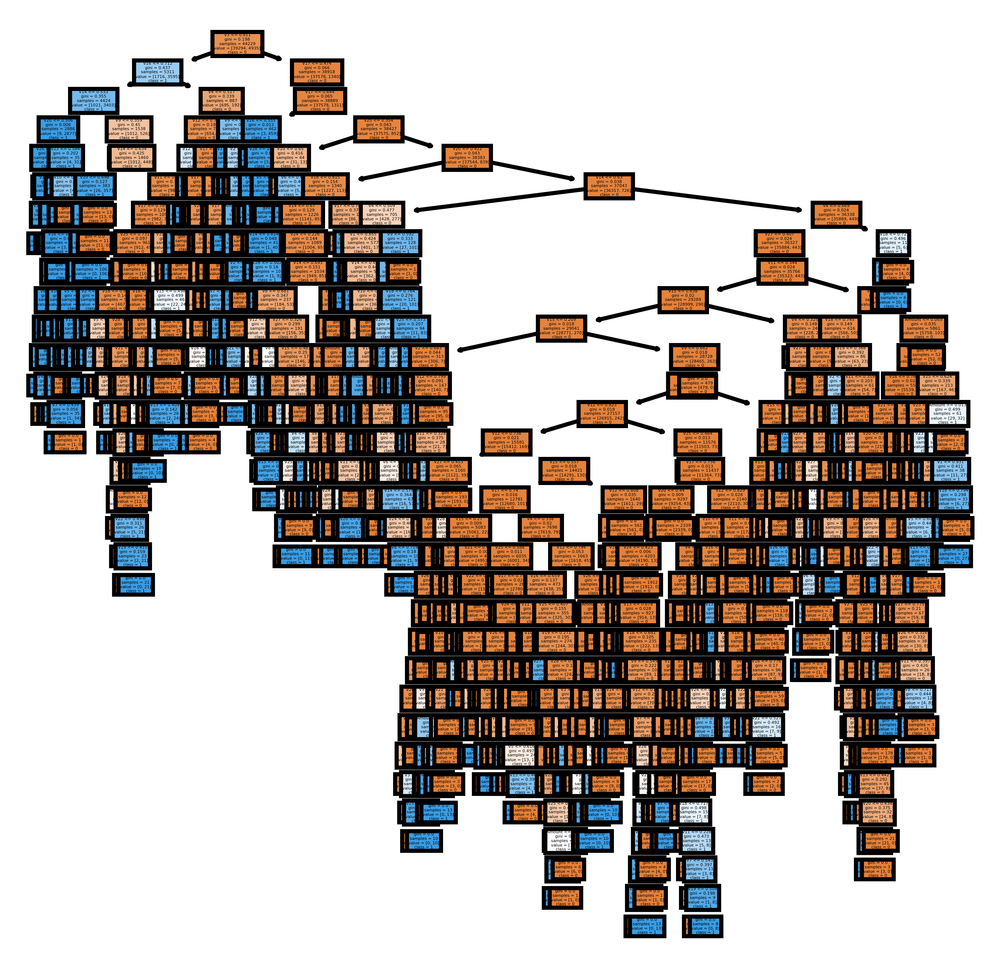

In [41]:
# Visualize individual trees and code below visualizes the first decision tree of Extra Trees Classifier

from sklearn import tree

fn1=figcols
cn1=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800)
tree.plot_tree(ModelET.estimators_[0],
               feature_names = fn1, 
               class_names=cn1,
               filled = True);
#fig.savefig('ModelET.png')
# Visualize individual trees and code below visualizes the first 5 decision trees of Extra Trees Classifier

from sklearn import tree

fn2=figcols
cn2=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(ModelET.estimators_[index],
                   feature_names = fn2, 
                   class_names=cn2,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
#fig.savefig('ModelET1.png')

# knn

In [42]:
#load the data
KNN_Results=pd.read_csv(r"KNN_Results.csv",header=0)
KNN_Results.head()

,Model Name,KNN K Value,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


KNN_K_value =  1
Model Name:  KNeighborsClassifier(n_neighbors=1)
Confusion matrix : 
 [[ 1759   326]
 [   25 16846]]
Outcome values : 
 1759 326 25 16846
Classification report : 
               precision    recall  f1-score   support

           1       0.99      0.84      0.91      2085
           0       0.98      1.00      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.98      0.92      0.95     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.1 %
Precision : 98.6 %
Recall : 84.4 %
F1 Score : 0.909
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 92.2 %
MCC : 0.902
roc_auc_score: 0.921


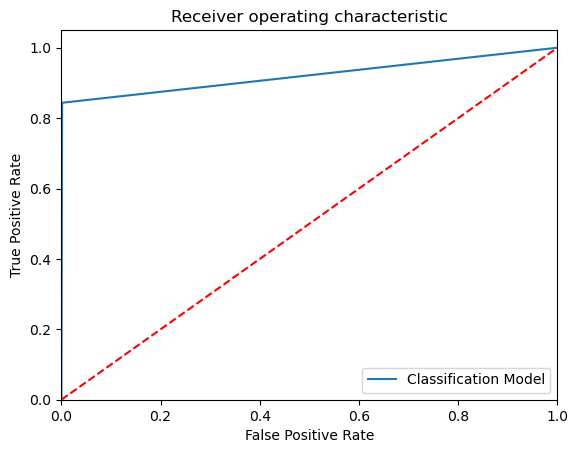

KNN_K_value =  2
Model Name:  KNeighborsClassifier(n_neighbors=2)
Confusion matrix : 
 [[ 1759   326]
 [   25 16846]]
Outcome values : 
 1759 326 25 16846
Classification report : 
               precision    recall  f1-score   support

           1       0.99      0.84      0.91      2085
           0       0.98      1.00      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.98      0.92      0.95     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.1 %
Precision : 98.6 %
Recall : 84.4 %
F1 Score : 0.909
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 92.2 %
MCC : 0.902
roc_auc_score: 0.921


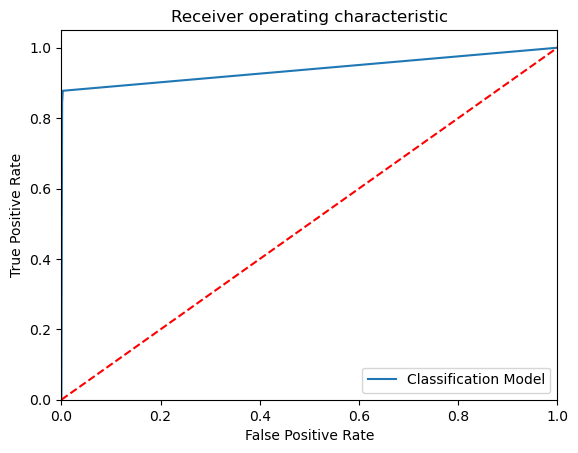

KNN_K_value =  3
Model Name:  KNeighborsClassifier(n_neighbors=3)
Confusion matrix : 
 [[ 1830   255]
 [   47 16824]]
Outcome values : 
 1830 255 47 16824
Classification report : 
               precision    recall  f1-score   support

           1       0.97      0.88      0.92      2085
           0       0.99      1.00      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.98      0.94      0.96     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.4 %
Precision : 97.5 %
Recall : 87.8 %
F1 Score : 0.924
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 93.8 %
MCC : 0.916
roc_auc_score: 0.937


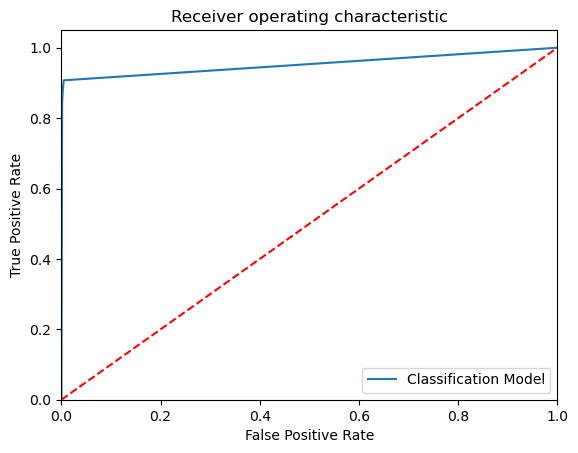

KNN_K_value =  4
Model Name:  KNeighborsClassifier(n_neighbors=4)
Confusion matrix : 
 [[ 1830   255]
 [   47 16824]]
Outcome values : 
 1830 255 47 16824
Classification report : 
               precision    recall  f1-score   support

           1       0.97      0.88      0.92      2085
           0       0.99      1.00      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.98      0.94      0.96     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.4 %
Precision : 97.5 %
Recall : 87.8 %
F1 Score : 0.924
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 93.8 %
MCC : 0.916
roc_auc_score: 0.937


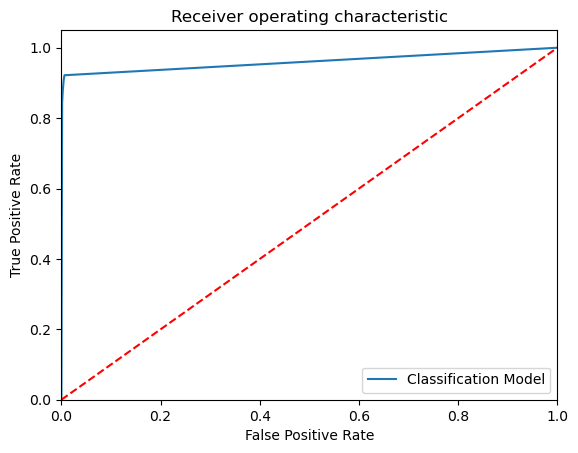

KNN_K_value =  5
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[ 1892   193]
 [   77 16794]]
Outcome values : 
 1892 193 77 16794
Classification report : 
               precision    recall  f1-score   support

           1       0.96      0.91      0.93      2085
           0       0.99      1.00      0.99     16871

    accuracy                           0.99     18956
   macro avg       0.97      0.95      0.96     18956
weighted avg       0.99      0.99      0.99     18956

Accuracy : 98.6 %
Precision : 96.1 %
Recall : 90.7 %
F1 Score : 0.933
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 95.1 %
MCC : 0.926
roc_auc_score: 0.951


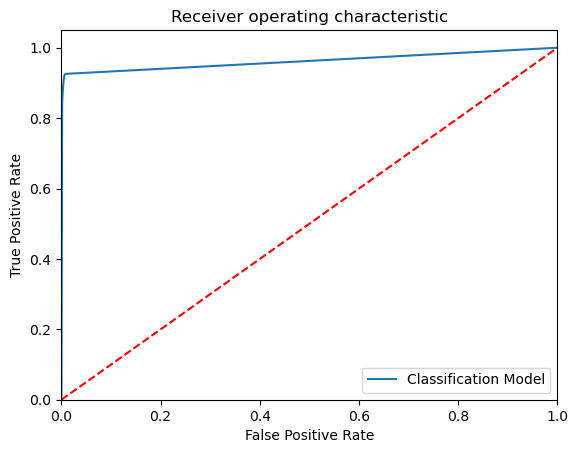

KNN_K_value =  6
Model Name:  KNeighborsClassifier(n_neighbors=6)
Confusion matrix : 
 [[ 1892   193]
 [   77 16794]]
Outcome values : 
 1892 193 77 16794
Classification report : 
               precision    recall  f1-score   support

           1       0.96      0.91      0.93      2085
           0       0.99      1.00      0.99     16871

    accuracy                           0.99     18956
   macro avg       0.97      0.95      0.96     18956
weighted avg       0.99      0.99      0.99     18956

Accuracy : 98.6 %
Precision : 96.1 %
Recall : 90.7 %
F1 Score : 0.933
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 95.1 %
MCC : 0.926
roc_auc_score: 0.951


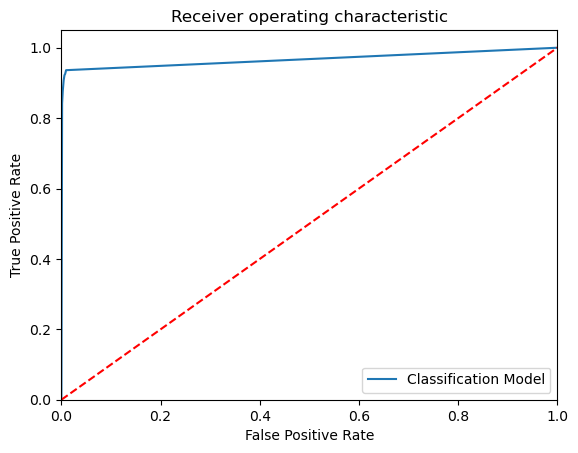

KNN_K_value =  7
Model Name:  KNeighborsClassifier(n_neighbors=7)
Confusion matrix : 
 [[ 1922   163]
 [  104 16767]]
Outcome values : 
 1922 163 104 16767
Classification report : 
               precision    recall  f1-score   support

           1       0.95      0.92      0.94      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.99     18956
   macro avg       0.97      0.96      0.96     18956
weighted avg       0.99      0.99      0.99     18956

Accuracy : 98.6 %
Precision : 94.9 %
Recall : 92.2 %
F1 Score : 0.935
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 95.8 %
MCC : 0.927
roc_auc_score: 0.958


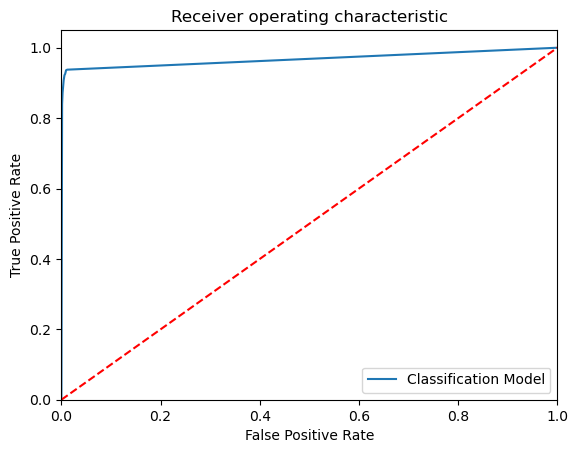

KNN_K_value =  8
Model Name:  KNeighborsClassifier(n_neighbors=8)
Confusion matrix : 
 [[ 1922   163]
 [  104 16767]]
Outcome values : 
 1922 163 104 16767
Classification report : 
               precision    recall  f1-score   support

           1       0.95      0.92      0.94      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.99     18956
   macro avg       0.97      0.96      0.96     18956
weighted avg       0.99      0.99      0.99     18956

Accuracy : 98.6 %
Precision : 94.9 %
Recall : 92.2 %
F1 Score : 0.935
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 95.8 %
MCC : 0.927
roc_auc_score: 0.958


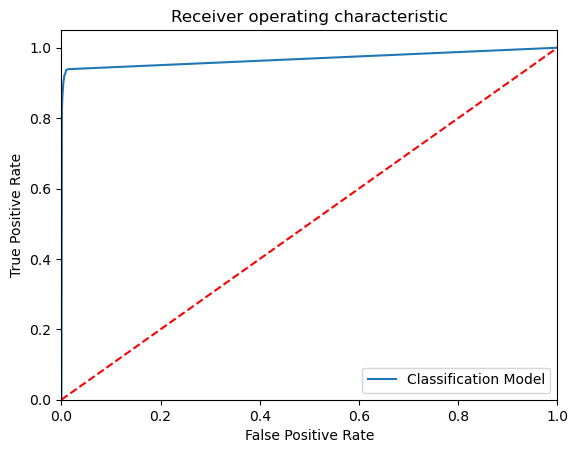

KNN_K_value =  9
Model Name:  KNeighborsClassifier(n_neighbors=9)
Confusion matrix : 
 [[ 1930   155]
 [  128 16743]]
Outcome values : 
 1930 155 128 16743
Classification report : 
               precision    recall  f1-score   support

           1       0.94      0.93      0.93      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.99     18956
   macro avg       0.96      0.96      0.96     18956
weighted avg       0.98      0.99      0.99     18956

Accuracy : 98.5 %
Precision : 93.8 %
Recall : 92.6 %
F1 Score : 0.932
Specificity or True Negative Rate : 99.2 %
Balanced Accuracy : 95.9 %
MCC : 0.923
roc_auc_score: 0.959


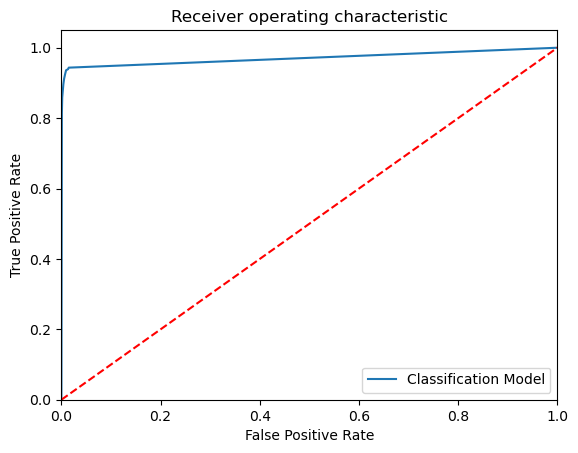

KNN_K_value =  10
Model Name:  KNeighborsClassifier(n_neighbors=10)
Confusion matrix : 
 [[ 1917   168]
 [  117 16754]]
Outcome values : 
 1917 168 117 16754
Classification report : 
               precision    recall  f1-score   support

           1       0.94      0.92      0.93      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.97      0.96      0.96     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.5 %
Precision : 94.2 %
Recall : 91.9 %
F1 Score : 0.931
Specificity or True Negative Rate : 99.3 %
Balanced Accuracy : 95.6 %
MCC : 0.922
roc_auc_score: 0.956


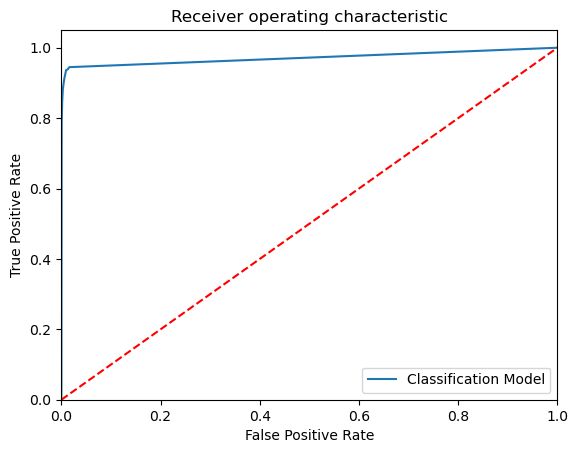

KNN_K_value =  11
Model Name:  KNeighborsClassifier(n_neighbors=11)
Confusion matrix : 
 [[ 1939   146]
 [  146 16725]]
Outcome values : 
 1939 146 146 16725
Classification report : 
               precision    recall  f1-score   support

           1       0.93      0.93      0.93      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.96      0.96      0.96     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.5 %
Precision : 93.0 %
Recall : 93.0 %
F1 Score : 0.93
Specificity or True Negative Rate : 99.1 %
Balanced Accuracy : 96.0 %
MCC : 0.921
roc_auc_score: 0.961


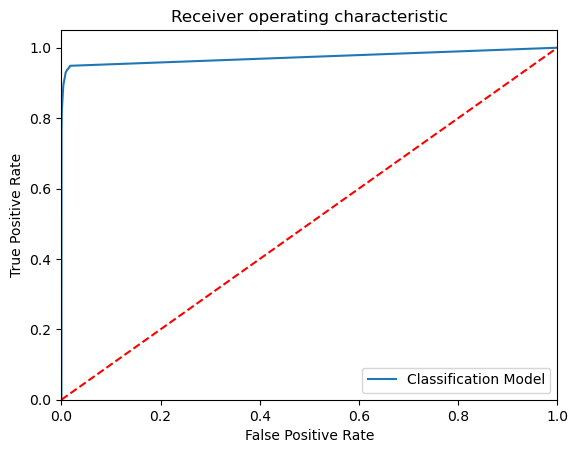

KNN_K_value =  12
Model Name:  KNeighborsClassifier(n_neighbors=12)
Confusion matrix : 
 [[ 1932   153]
 [  145 16726]]
Outcome values : 
 1932 153 145 16726
Classification report : 
               precision    recall  f1-score   support

           1       0.93      0.93      0.93      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.96      0.96      0.96     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.4 %
Precision : 93.0 %
Recall : 92.7 %
F1 Score : 0.928
Specificity or True Negative Rate : 99.1 %
Balanced Accuracy : 95.9 %
MCC : 0.92
roc_auc_score: 0.959


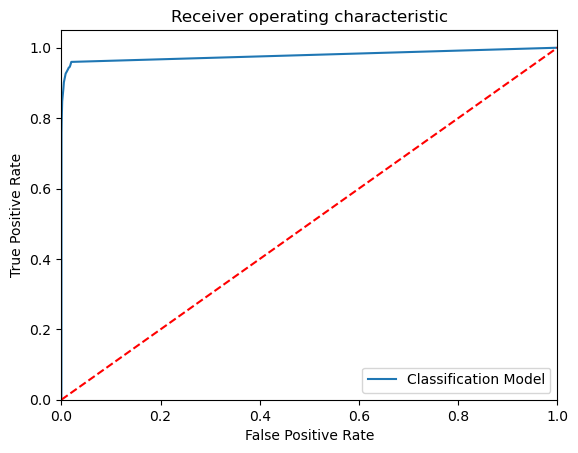

KNN_K_value =  13
Model Name:  KNeighborsClassifier(n_neighbors=13)
Confusion matrix : 
 [[ 1935   150]
 [  177 16694]]
Outcome values : 
 1935 150 177 16694
Classification report : 
               precision    recall  f1-score   support

           1       0.92      0.93      0.92      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.95      0.96      0.96     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.3 %
Precision : 91.6 %
Recall : 92.8 %
F1 Score : 0.922
Specificity or True Negative Rate : 99.0 %
Balanced Accuracy : 95.9 %
MCC : 0.912
roc_auc_score: 0.959


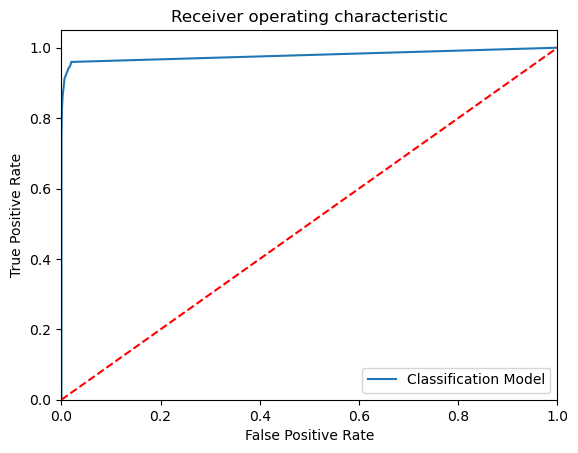

KNN_K_value =  14
Model Name:  KNeighborsClassifier(n_neighbors=14)
Confusion matrix : 
 [[ 1905   180]
 [  131 16740]]
Outcome values : 
 1905 180 131 16740
Classification report : 
               precision    recall  f1-score   support

           1       0.94      0.91      0.92      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.96      0.95      0.96     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.4 %
Precision : 93.6 %
Recall : 91.4 %
F1 Score : 0.925
Specificity or True Negative Rate : 99.2 %
Balanced Accuracy : 95.3 %
MCC : 0.915
roc_auc_score: 0.953


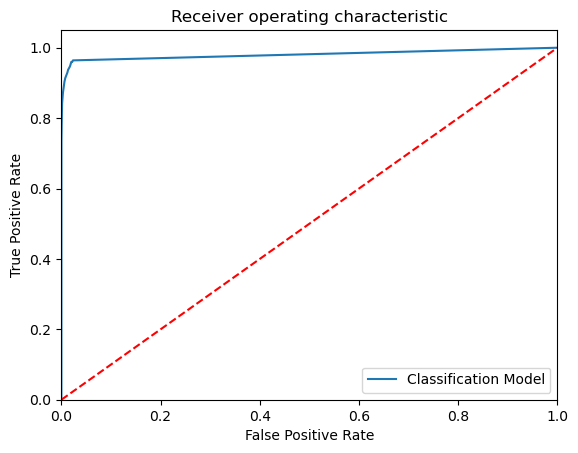

KNN_K_value =  15
Model Name:  KNeighborsClassifier(n_neighbors=15)
Confusion matrix : 
 [[ 1912   173]
 [  151 16720]]
Outcome values : 
 1912 173 151 16720
Classification report : 
               precision    recall  f1-score   support

           1       0.93      0.92      0.92      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.96      0.95      0.96     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.3 %
Precision : 92.7 %
Recall : 91.7 %
F1 Score : 0.922
Specificity or True Negative Rate : 99.1 %
Balanced Accuracy : 95.4 %
MCC : 0.912
roc_auc_score: 0.954


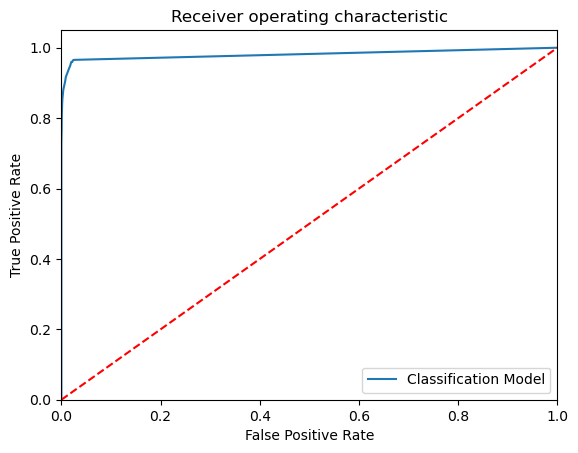

KNN_K_value =  16
Model Name:  KNeighborsClassifier(n_neighbors=16)
Confusion matrix : 
 [[ 1894   191]
 [  148 16723]]
Outcome values : 
 1894 191 148 16723
Classification report : 
               precision    recall  f1-score   support

           1       0.93      0.91      0.92      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.96      0.95      0.95     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.2 %
Precision : 92.8 %
Recall : 90.8 %
F1 Score : 0.918
Specificity or True Negative Rate : 99.1 %
Balanced Accuracy : 95.0 %
MCC : 0.908
roc_auc_score: 0.95


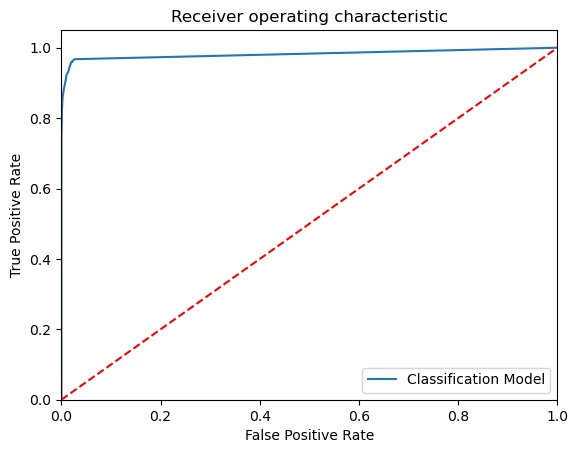

KNN_K_value =  17
Model Name:  KNeighborsClassifier(n_neighbors=17)
Confusion matrix : 
 [[ 1903   182]
 [  165 16706]]
Outcome values : 
 1903 182 165 16706
Classification report : 
               precision    recall  f1-score   support

           1       0.92      0.91      0.92      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.95      0.95      0.95     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.2 %
Precision : 92.0 %
Recall : 91.3 %
F1 Score : 0.916
Specificity or True Negative Rate : 99.0 %
Balanced Accuracy : 95.2 %
MCC : 0.906
roc_auc_score: 0.951


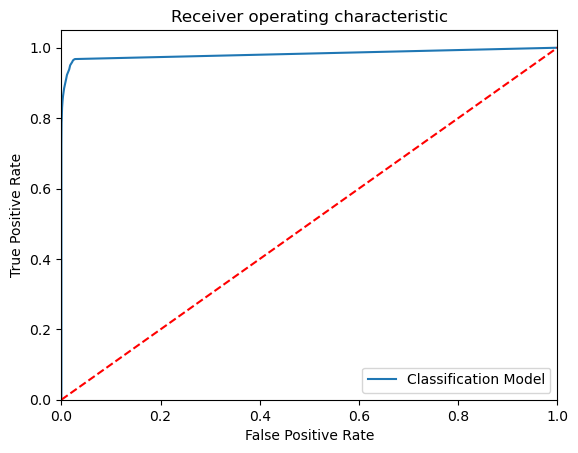

KNN_K_value =  18
Model Name:  KNeighborsClassifier(n_neighbors=18)
Confusion matrix : 
 [[ 1853   232]
 [  103 16768]]
Outcome values : 
 1853 232 103 16768
Classification report : 
               precision    recall  f1-score   support

           1       0.95      0.89      0.92      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.97      0.94      0.95     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.2 %
Precision : 94.7 %
Recall : 88.9 %
F1 Score : 0.917
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 94.2 %
MCC : 0.908
roc_auc_score: 0.941


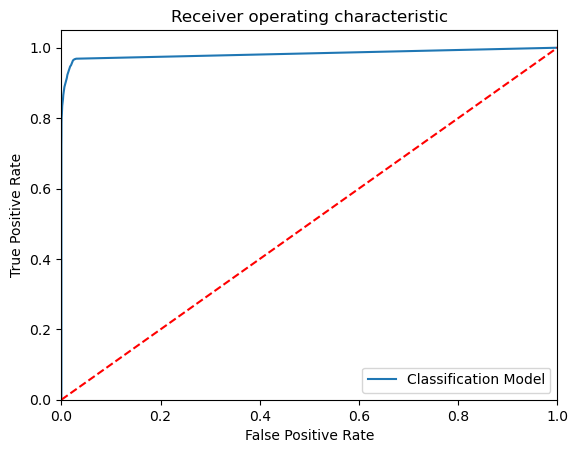

KNN_K_value =  19
Model Name:  KNeighborsClassifier(n_neighbors=19)
Confusion matrix : 
 [[ 1856   229]
 [  117 16754]]
Outcome values : 
 1856 229 117 16754
Classification report : 
               precision    recall  f1-score   support

           1       0.94      0.89      0.91      2085
           0       0.99      0.99      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.96      0.94      0.95     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.2 %
Precision : 94.1 %
Recall : 89.0 %
F1 Score : 0.915
Specificity or True Negative Rate : 99.3 %
Balanced Accuracy : 94.2 %
MCC : 0.905
roc_auc_score: 0.942


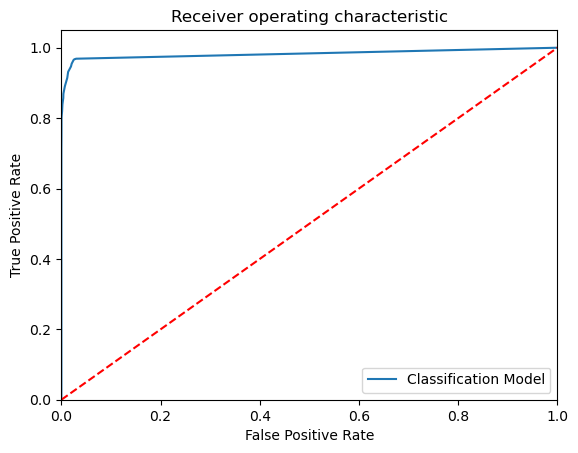

KNN_K_value =  20
Model Name:  KNeighborsClassifier(n_neighbors=20)
Confusion matrix : 
 [[ 1821   264]
 [   78 16793]]
Outcome values : 
 1821 264 78 16793
Classification report : 
               precision    recall  f1-score   support

           1       0.96      0.87      0.91      2085
           0       0.98      1.00      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.97      0.93      0.95     18956
weighted avg       0.98      0.98      0.98     18956

Accuracy : 98.2 %
Precision : 95.9 %
Recall : 87.3 %
F1 Score : 0.914
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 93.4 %
MCC : 0.905
roc_auc_score: 0.934


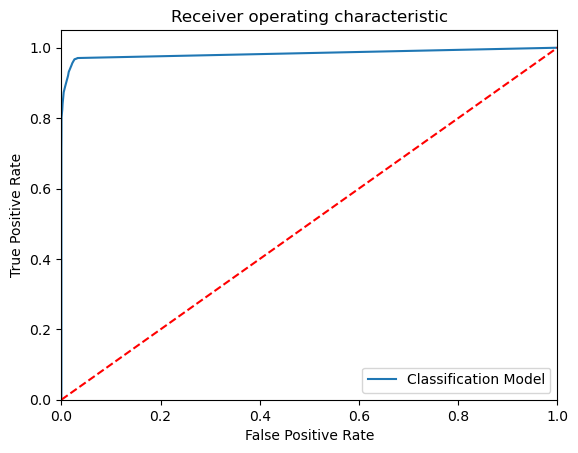

In [43]:
# Bild KNN Model

from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import sklearn.metrics as metrics

from sklearn.metrics import roc_curve, roc_auc_score

accuracy = []

for a in range(1, 21, 1):
    
    k = a
    
    # Build the model
    
    ModelKNN = KNeighborsClassifier(n_neighbors=k)
    
    # Train the model
    
    ModelKNN.fit(x_train, y_train)
    
    # Predict the model
    
    y_pred = ModelKNN.predict(x_test)
    y_pred_prob = ModelKNN.predict_proba(x_test)
    
    print('KNN_K_value = ', a)
    
    # Print the model name
    
    print('Model Name: ', ModelKNN)
    
    # confusion matrix in sklearn
    
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report
    
    # actual values
    
    actual = y_test
    
    # predicted values
    
    predicted = y_pred
    
    # confusion matrix
    
    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)
    
    # outcome values order in sklearn
    
    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)
    
    # classification report for precision, recall f1-score and accuracy
    
    C_Report = classification_report(actual,predicted,labels=[1,0])
    
    print('Classification report : \n', C_Report)
    
    # calculating the metrics
    
    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);
    
    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model
    
    from math import sqrt
    
    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)
    
    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)
    
    # Area under ROC curve 
    
    from sklearn.metrics import roc_curve, roc_auc_score
    
    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, ModelKNN.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    #plt.savefig('Log_ROC')
    plt.show()
    #------------------------------------------------------------------------------
    new_row = {'Model Name' : ModelKNN,
               'KNN K Value' : a,
               'True_Positive' : tp,
               'False_Negative' : fn,
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    KNN_Results = KNN_Results.append(new_row, ignore_index=True)
    #------KNN_Results------------------------------------------------------------------------


# naive_bayes

Confusion matrix : 
 [[ 2085     0]
 [16871     0]]
Outcome values : 
 2085 0 16871 0
Classification report : 
               precision    recall  f1-score   support

           1       0.11      1.00      0.20      2085
           0       0.00      0.00      0.00     16871

    accuracy                           0.11     18956
   macro avg       0.05      0.50      0.10     18956
weighted avg       0.01      0.11      0.02     18956

Accuracy : 11.0 %
Precision : 11.0 %
Recall : 100.0 %
F1 Score : 0.198
Specificity or True Negative Rate : 0.0 %
Balanced Accuracy : 50.0 %
MCC : nan
roc_auc_score: 0.5


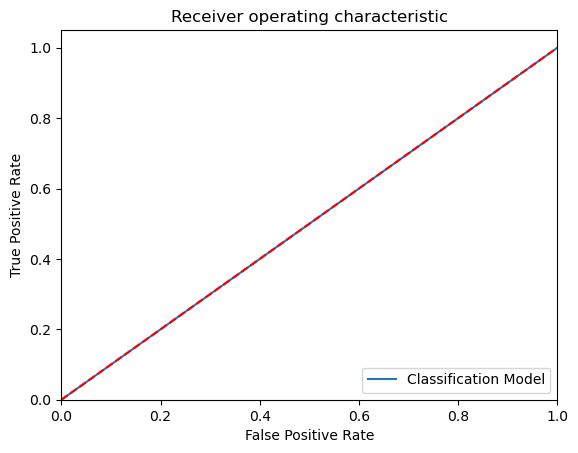

-----------------------------------------------------------------------------------------------------


In [44]:
# Training the Naive Bayes model (GaussianNB) on the Training set

from sklearn.naive_bayes import GaussianNB

modelGNB = GaussianNB(priors=None, var_smoothing=1e-09)

# Fit the model with train data

modelGNB.fit(x_train,y_train)

# Predict the model with test data set

y_pred = modelGNB.predict(x_test)
y_pred_prob = modelGNB.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%' )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual,modelGNB.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

# svm

Model Name:  SVM - Gaussian
Confusion matrix : 
 [[ 1472   613]
 [    4 16867]]
Outcome values : 
 1472 613 4 16867
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.71      0.83      2085
           0       0.96      1.00      0.98     16871

    accuracy                           0.97     18956
   macro avg       0.98      0.85      0.90     18956
weighted avg       0.97      0.97      0.96     18956

Accuracy : 96.7 %
Precision : 99.7 %
Recall : 70.6 %
F1 Score : 0.827
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 85.3 %
MCC : 0.824
roc_auc_score: 0.853


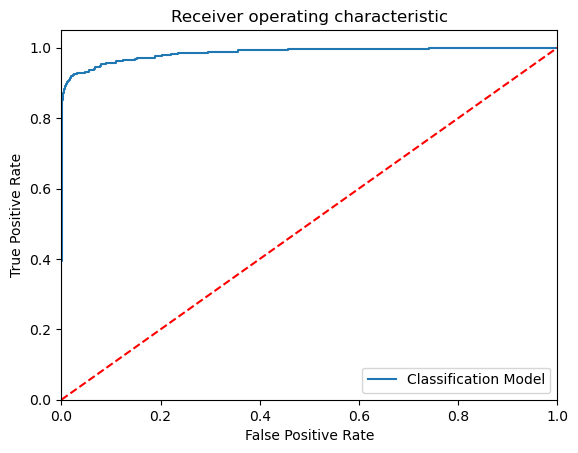

-----------------------------------------------------------------------------------------------------


In [45]:
# Training the SVM algorithm

from sklearn.svm import SVC

ModelSVMGaussian = SVC(kernel='rbf', random_state = 42, class_weight='balanced', probability=True)

# Train the model

ModelSVMGaussian.fit(x_train, y_train)

# Predict the model with test data set

y_pred = ModelSVMGaussian.predict(x_test)
y_pred_prob = ModelSVMGaussian.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Print the model name
    
print('Model Name: ', "SVM - Gaussian")

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test,ModelSVMGaussian.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot
plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')
#---
new_row = {'Model Name' : "SVM - Gaussian",
            'True_Positive' : tp, 
            'False_Negative' : fn, 
            'False_Positive' : fp,
            'True_Negative' : tn,
            'Accuracy' : accuracy,
            'Precision' : precision,
            'Recall' : sensitivity,
            'F1 Score' : f1Score,
            'Specificity' : specificity,
            'MCC':MCC,
            'ROC_AUC_Score':roc_auc_score(actual, predicted),
            'Balanced Accuracy':balanced_accuracy}
EMResults = EMResults.append(new_row, ignore_index=True)
#---------------------------------------------------------------------------------------------------------------

In [46]:
# display the final results

Results= pd.DataFrame({'Class_A':y_test,'Class_P':y_pred})

# Merge two Dataframes on index of both the dataframes

ResultsFinal =CCdataN_BK2.merge(Results, left_index=True, right_index=True)

# Display 10 records randomly

ResultsFinal.sample(5)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Class_A,Class_P
30704,2.037694,-0.267971,-1.289067,0.212133,-0.022962,-0.657227,-0.041986,-0.056196,0.588366,0.292798,0.222442,0.005447,-1.750465,0.806188,-0.425651,0.316114,-0.607973,0.005142,0.625017,-0.299507,-0.285368,-0.826689,0.284365,-0.541981,-0.329001,0.213307,-0.088396,-0.077586,8.99,0,0,0
35998,1.117716,0.756621,0.050745,2.660306,0.019565,-0.658176,0.095240,0.036308,-0.911668,0.292635,1.547237,-0.335167,-1.400183,-0.775497,0.053290,1.291240,0.462250,1.097591,-1.087555,-0.170396,0.090440,0.159976,-0.124728,0.380518,0.544631,0.120499,-0.009410,0.042060,10.00,0,0,0
20944,-0.319941,0.999985,-0.107982,-0.522651,-0.047612,-1.189630,0.627004,0.277204,-0.052644,-0.614334,-1.253011,-0.284129,-1.021052,0.647892,-0.322101,0.080266,-0.175444,-0.573411,-0.088133,-0.187056,-0.221714,-0.671400,0.172906,0.006831,-0.497366,0.143399,0.109758,0.033254,17.99,0,0,0
47714,-0.851601,0.877659,0.564555,-0.117213,1.600314,4.245213,-0.883978,1.651435,-0.040154,-0.489752,-0.801988,0.086240,-0.002950,0.017313,0.512495,0.139334,-0.300497,0.676429,0.983729,0.169676,-0.041392,-0.076186,-0.178351,1.002085,0.187901,-0.293791,0.292018,0.119944,4.99,0,0,0
11863,-0.166756,0.550115,0.354964,-0.856581,0.880025,-0.487007,1.446140,-0.486152,0.236914,0.270489,0.253349,-0.164444,-1.359552,0.092232,-1.193855,-0.107564,-0.853567,-0.019112,0.495315,0.027625,-0.240833,-0.220111,0.016276,-0.427333,-0.891064,0.096064,-0.059526,-0.205502,33.72,0,0,0


# compare and classification Algorithm

In [47]:
#load the data
EMResults=pd.read_csv(r"EMResults.csv")
EMResults.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision\tRecall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


Model Name:  LogisticRegression()
Confusion matrix : 
 [[ 1630   455]
 [    6 16865]]
Outcome values : 
 1630 455 6 16865
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.78      0.88      2085
           0       0.97      1.00      0.99     16871

    accuracy                           0.98     18956
   macro avg       0.99      0.89      0.93     18956
weighted avg       0.98      0.98      0.97     18956

Accuracy : 97.6 %
Precision : 99.6 %
Recall : 78.2 %
F1 Score : 0.876
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 89.1 %
MCC : 0.871
roc_auc_score: 0.891


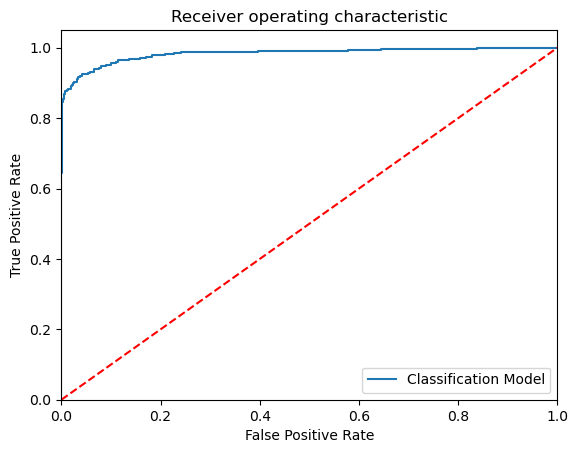

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[ 1473   612]
 [   23 16848]]
Outcome values : 
 1473 612 23 16848
Classification report : 
               precision    recall  f1-score   support

           1       0.98      0.71      0.82      2085
           0       0.96      1.00      0.98     16871

    accuracy                           0.97     18956
   macro avg       0.97      0.85      0.90     18956
weighted avg       0.97      0.97      0.96     18956

Accuracy : 96.7 %
Precision : 98.5 %
Recall : 70.6 %
F1 Score : 0.823
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 85.2 %
MCC : 0.818
roc_auc_score: 0.853


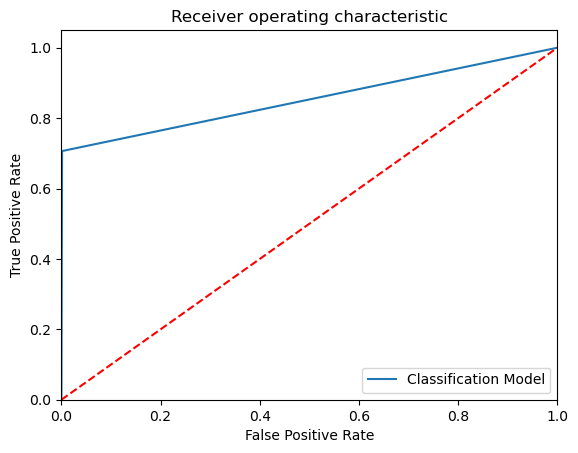

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[ 1489   596]
 [    3 16868]]
Outcome values : 
 1489 596 3 16868
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.71      0.83      2085
           0       0.97      1.00      0.98     16871

    accuracy                           0.97     18956
   macro avg       0.98      0.86      0.91     18956
weighted avg       0.97      0.97      0.97     18956

Accuracy : 96.8 %
Precision : 99.8 %
Recall : 71.4 %
F1 Score : 0.833
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 85.7 %
MCC : 0.83
roc_auc_score: 0.857


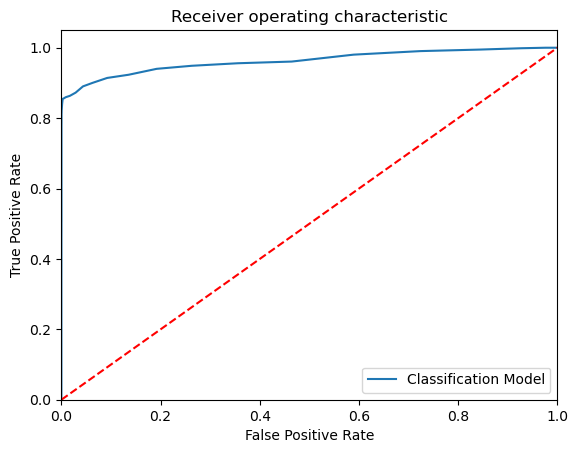

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[ 1459   626]
 [    3 16868]]
Outcome values : 
 1459 626 3 16868
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.70      0.82      2085
           0       0.96      1.00      0.98     16871

    accuracy                           0.97     18956
   macro avg       0.98      0.85      0.90     18956
weighted avg       0.97      0.97      0.96     18956

Accuracy : 96.7 %
Precision : 99.8 %
Recall : 70.0 %
F1 Score : 0.823
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 85.0 %
MCC : 0.82
roc_auc_score: 0.85


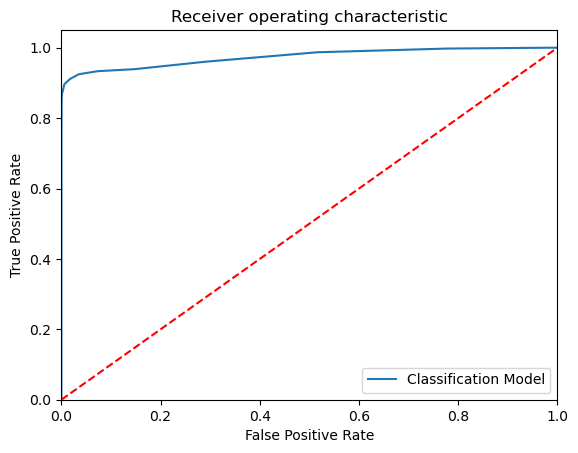

-----------------------------------------------------------------------------------------------------
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[ 1892   193]
 [   77 16794]]
Outcome values : 
 1892 193 77 16794
Classification report : 
               precision    recall  f1-score   support

           1       0.96      0.91      0.93      2085
           0       0.99      1.00      0.99     16871

    accuracy                           0.99     18956
   macro avg       0.97      0.95      0.96     18956
weighted avg       0.99      0.99      0.99     18956

Accuracy : 98.6 %
Precision : 96.1 %
Recall : 90.7 %
F1 Score : 0.933
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 95.1 %
MCC : 0.926
roc_auc_score: 0.951


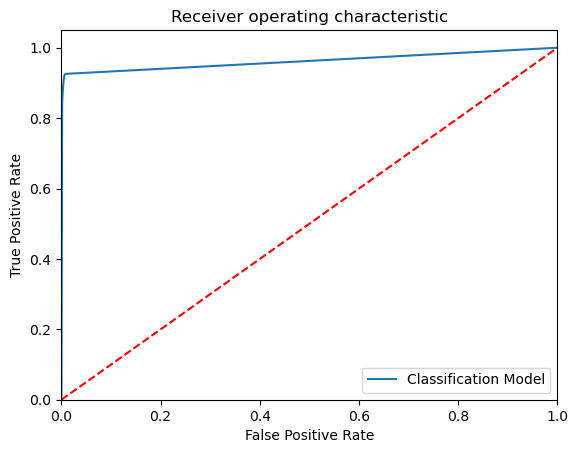

-----------------------------------------------------------------------------------------------------
Model Name:  SVC(class_weight='balanced', kernel='linear', probability=True, random_state=42)
Confusion matrix : 
 [[ 1573   512]
 [   13 16858]]
Outcome values : 
 1573 512 13 16858
Classification report : 
               precision    recall  f1-score   support

           1       0.99      0.75      0.86      2085
           0       0.97      1.00      0.98     16871

    accuracy                           0.97     18956
   macro avg       0.98      0.88      0.92     18956
weighted avg       0.97      0.97      0.97     18956

Accuracy : 97.2 %
Precision : 99.2 %
Recall : 75.4 %
F1 Score : 0.857
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 87.6 %
MCC : 0.852
roc_auc_score: 0.877


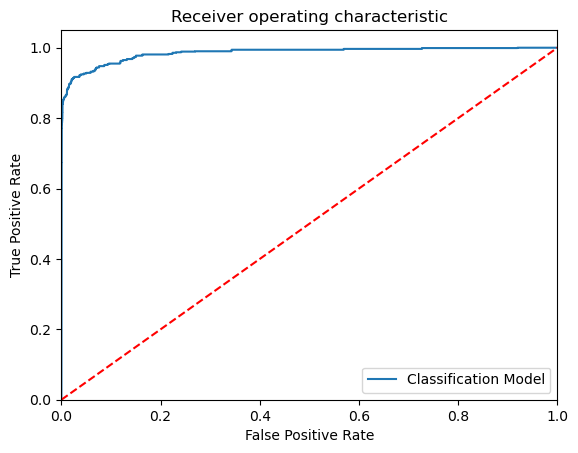

-----------------------------------------------------------------------------------------------------


In [48]:
# Build the Classification models and compare the results

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Create objects of classification algorithm with default hyper-parameters

ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
ModelKNN = KNeighborsClassifier(n_neighbors=5)
ModelSVM = SVC(kernel='linear', random_state = 42, class_weight='balanced', probability=True)

# Evaluation matrix for all the algorithms

MM = [ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelSVM]

for models in MM:
    
    # Fit the model
    
    models.fit(x_train, y_train)
    
    # Prediction
    
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)
    
    # Print the model name
    
    print('Model Name: ', models)
    
    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])

    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve 

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #---
    new_row = {'Model Name' : models,
               'True_Positive' : tp, 
               'False_Negative' : fn, 
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    EMResults = EMResults.append(new_row, ignore_index=True)
    #------------------------------------------------------------------------------------------------------------------


In [49]:
#Display the data
EMResults.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision\tRecall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy,Precision,Recall
0,LogisticRegression(),1630,455,6,16865,0.976,NaN,0.876,1.000,0.871,0.890709,0.891,0.996,0.782
1,DecisionTreeClassifier(),1473,612,23,16848,0.967,NaN,0.823,0.999,0.818,0.852556,0.852,0.985,0.706
2,"(DecisionTreeClassifier(max_features='sqrt', r...",1489,596,3,16868,0.968,NaN,0.833,1.000,0.830,0.856985,0.857,0.998,0.714
3,"(ExtraTreeClassifier(random_state=1418176001),...",1459,626,3,16868,0.967,NaN,0.823,1.000,0.820,0.849791,0.850,0.998,0.700
4,KNeighborsClassifier(),1892,193,77,16794,0.986,NaN,0.933,0.995,0.926,0.951435,0.951,0.961,0.907


In [54]:
print(max(EMResults['Accuracy']),end=" ----> ")
print(EMResults.loc[EMResults['Accuracy'].idxmax(), 'Model Name'])

0.986 ----> KNeighborsClassifier()


In [55]:
#predict the values with knn algorithm
y_predKNN=ModelRF.predict(x_test)

In [56]:
#Results(Run upto here only)
Results=pd.DataFrame({'Exited_A':y_test, 'Exited_P':y_predKNN})
# Merge two Dataframes on index of both the dataframes
ResultsFinal=CCdataN_BK2.merge(Results, left_index=True, right_index=True)
# Display 10 records randomly
ResultsFinal.sample(10)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Exited_A,Exited_P
19793,2.236933,-1.454666,-1.042089,-1.668182,-1.116605,-0.304271,-1.192150,-0.007628,-1.397847,1.752565,0.627483,-0.504351,-0.430360,-0.046013,-0.750636,-0.438592,0.361025,0.371719,0.088396,-0.441221,-0.117865,0.063590,0.263361,0.666463,-0.227162,-0.209576,-0.003470,-0.054616,25.00,0,0,0
748,0.275162,0.954113,0.629019,0.936765,0.613203,-0.633409,1.012220,-0.578277,-0.630674,0.196799,-0.487061,0.199749,1.276062,0.161927,1.899138,-1.434339,0.265999,0.331112,2.566628,0.362205,0.301296,1.310743,-0.405112,-0.005238,-0.188244,0.274344,0.054362,-0.046801,1.79,0,0,0
1592,1.212831,0.275149,0.269025,0.647729,-0.222941,-0.613114,-0.019970,-0.040988,0.093358,-0.314266,0.082282,0.093301,-0.220350,-0.174302,1.392677,0.206116,0.297426,-0.695752,-0.553860,-0.139825,-0.264889,-0.750478,0.163972,0.022245,0.128852,0.125548,-0.009378,0.026495,1.79,0,0,0
54039,-0.803508,1.299763,1.104003,1.492064,-0.436539,-0.553335,0.775196,0.228989,-1.223371,-0.369636,-0.559217,-0.271404,-0.224342,0.869955,1.567469,-0.680424,0.489363,0.178621,1.550260,0.199604,0.118396,0.122653,-0.112477,0.381002,0.471503,-0.072328,-0.064008,0.024204,84.59,0,0,0
52667,2.327713,-1.484393,-2.696354,-2.692333,1.382574,3.174044,-1.427327,0.686444,-1.702841,1.703248,-0.090989,-0.896234,0.357888,0.039500,0.625244,-0.660377,0.299563,-0.041624,-0.484646,-0.367763,0.080612,0.620816,0.111689,0.720688,0.118428,0.098273,0.010489,-0.066954,10.00,0,0,0
10981,-0.656697,1.012916,1.444790,0.157903,0.034674,-0.868656,0.610683,-0.007874,-0.368950,-0.441707,0.507499,0.222417,0.090043,-0.423290,1.115135,-0.075313,0.465203,-0.773480,-0.634806,0.032794,-0.192946,-0.458896,0.210743,0.554074,-0.281893,0.060908,0.145721,0.083991,2.69,0,0,0
15943,-0.409317,1.106293,0.309508,-0.641913,0.814210,-1.050966,1.147914,-0.143480,-0.602846,-1.160120,1.174203,0.199780,-0.515331,-0.555270,-0.155350,0.338571,0.142338,1.169957,-0.224326,-0.096429,0.321663,0.941490,-0.459122,0.008285,0.282109,-0.125448,0.110885,0.143349,9.80,0,0,0
11915,1.899063,-0.097386,-1.795871,1.256038,0.478554,-0.646023,0.525427,-0.196003,0.144975,0.437459,0.222765,0.250043,-1.515270,0.969251,-1.052522,-0.381842,-0.424553,0.105020,0.180004,-0.244402,0.100011,0.295362,-0.089750,-0.420886,0.409306,-0.488437,-0.037631,-0.068366,64.98,0,0,0
12710,1.254575,-0.024253,-0.024430,0.200540,0.155754,0.422772,-0.278075,0.267486,0.161909,0.118903,0.322200,-0.296834,-1.568516,0.789020,0.886288,0.640112,-0.706212,0.128183,0.265325,-0.202834,-0.277524,-0.894977,0.032957,-1.208372,0.203056,0.185820,-0.030923,-0.010630,1.98,0,0,0
6965,-7.274184,-9.782353,-0.182936,3.541510,10.870765,-7.293806,-5.382940,0.512317,-0.282931,0.829557,-1.119393,0.504793,0.357200,1.239574,0.776220,-1.053103,-0.016116,0.282174,0.722754,2.869228,1.147929,0.139332,1.965189,0.628507,0.288190,-0.455486,-0.200514,0.426788,89.00,0,0,0
